In [1]:
from pyspark.sql import SQLContext
from pyspark.sql.functions import *

from collections import OrderedDict
from operator import itemgetter  
import numpy as np
import pandas as pd
import networkx as nx


from sklearn.model_selection import train_test_split
from sklearn.metrics.pairwise import cosine_similarity

sqlContext = SQLContext(sc)

In [239]:
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
# Original dataframes loaded with partitions on Spark

df_user_spark = sqlContext.read.format("jdbc").option("url", "jdbc:mysql://localhost:3306/yelp_db").option("driver","com.mysql.jdbc.Driver").option("dbtable", "user").option("partitionColumn","user_index").option("lowerBound",1).option("upperBound",1200000).option("numPartitions",1000).option("user", "root").option("password", "root").load()
df_user_categories_spark = sqlContext.read.format("jdbc").option("url", "jdbc:mysql://localhost:3306/yelp_db").option("driver","com.mysql.jdbc.Driver").option("dbtable", "user_category_mapping").option("partitionColumn","user_category_index").option("lowerBound",1).option("upperBound",8400000).option("numPartitions",1000).option("user", "root").option("password", "root").load()
df_friend_spark = sqlContext.read.format("jdbc").option("url", "jdbc:mysql://localhost:3306/yelp_db").option("driver","com.mysql.jdbc.Driver").option("dbtable", "friend").option("partitionColumn","id").option("lowerBound",1).option("upperBound",9400000).option("numPartitions",2000).option("user", "root").option("password", "root").load()

In [3]:
# Number of users per state in decending order

print (df_user_spark.cube("state").agg(grouping("state"),count("state").alias("count")).orderBy(desc("count")).show())

+-----+---------------+------+
|state|grouping(state)| count|
+-----+---------------+------+
| null|              1|889222|
|   NV|              0|368691|
|   AZ|              0|227145|
|   ON|              0| 74907|
|   NC|              0| 56536|
|   OH|              0| 46005|
|   PA|              0| 41792|
|   QC|              0| 28531|
|   WI|              0| 20939|
|   IL|              0|  8027|
|   BW|              0|  6998|
|  EDH|              0|  6945|
|   SC|              0|  1491|
|  HLD|              0|   304|
|  NYK|              0|   190|
|  CHE|              0|   178|
|  MLN|              0|   172|
|  FIF|              0|    73|
|   NY|              0|    46|
|   NI|              0|    39|
+-----+---------------+------+
only showing top 20 rows

None


In [4]:
df_business_spark = sqlContext.read.format("jdbc").option("url", "jdbc:mysql://localhost:3306/yelp_db").option("driver","com.mysql.jdbc.Driver").option("dbtable", "business").option("partitionColumn","business_index").option("lowerBound",1).option("upperBound",80000).option("numPartitions",500).option("user", "root").option("password", "root").load()

In [5]:
df_business_stats = df_business_spark.cube("state").agg(grouping("state"),count("state").alias("count")).orderBy(desc("count"))

In [6]:
df_business_stats_pandas = df_business_stats.toPandas()

In [7]:
df_business_stats_pandas = df_business_stats_pandas.drop(df_business_stats_pandas.index[0])

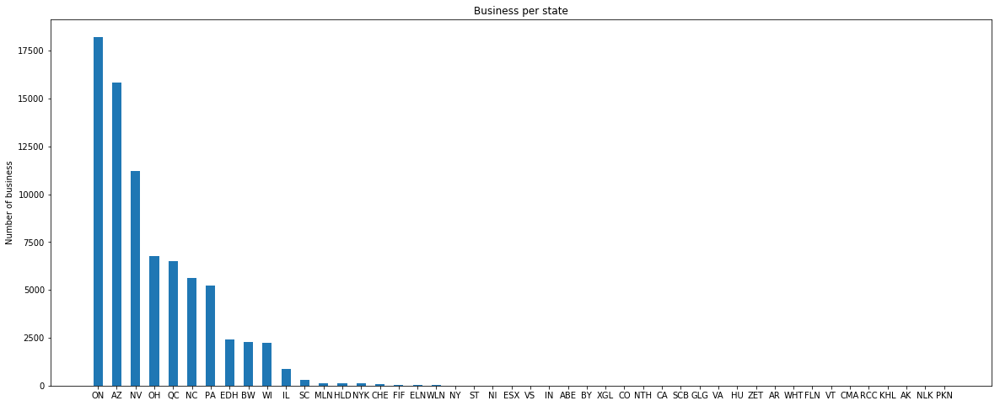

In [10]:
y_pos = np.arange(len(df_business_stats_pandas['state']))
plt.figure(figsize=(20, 8))
plt.bar(y_pos, df_business_stats_pandas['count'], align='center', width=0.5)
plt.xticks(y_pos, df_business_stats_pandas['state'])
plt.ylabel('Number of business')
plt.title('Business per state')
plt.show()

In [240]:
category_group_df_pandas = df_user_categories_spark.cube("category").agg(grouping("category"),count("category").alias("count")).orderBy(desc("count")).toPandas()

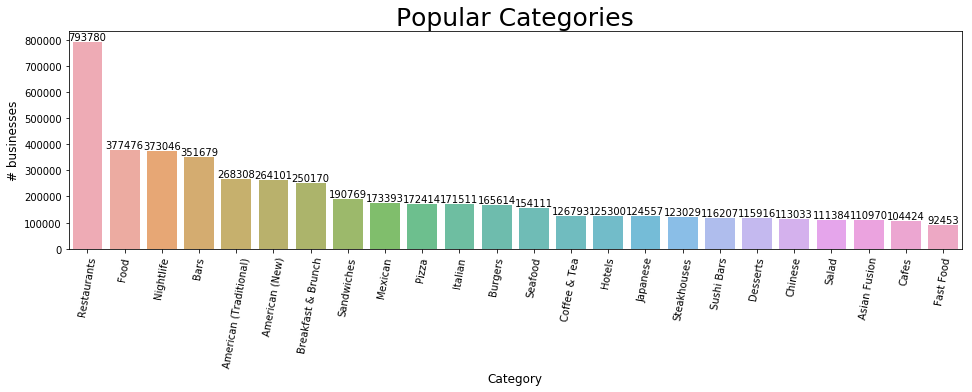

In [242]:
category_group_final_df = category_group_df_pandas.iloc[1:25]

#chart
plt.figure(figsize=(16,4))
ax = sns.barplot(category_group_final_df['category'], category_group_final_df['count'], alpha=0.8)
plt.title("Popular Categories",fontsize=25)
locs, labels = plt.xticks()
plt.setp(labels, rotation=80)
plt.ylabel('# businesses', fontsize=12)
plt.xlabel('Category', fontsize=12)

#adding the text labels
rects = ax.patches
labels = category_group_final_df['count']
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height + 5, label, ha='center', va='bottom')

plt.show()

In [14]:
df_user_IL_state = df_user_spark.filter(df_user_spark.state == 'IL').select(df_user_spark.id)

In [18]:
df_friends_IL_state = df_friend_spark.join(df_user_IL_state, df_friend_spark.user_id == df_user_IL_state.id).drop(df_user_IL_state.id)

In [19]:
# Friend list of users who are from 'IL' state
print(df_friends_IL_state.show())

+--------+--------------------+--------------------+
|      id|             user_id|           friend_id|
+--------+--------------------+--------------------+
|42682869|6CkttYFeiKbZtVAJq...|920rmV9d_q_76tT_3...|
|17639224|InEfg9vsCcknEG9T0...|8vlCXT4t4X_FWKf8G...|
|17639235|InEfg9vsCcknEG9T0...|o_1beq3LiW_JH_rgU...|
|17639261|InEfg9vsCcknEG9T0...|XtKwxbdNIHjEM3ajU...|
|17639269|InEfg9vsCcknEG9T0...|z6q3atk8AMY5mzuoH...|
|17639294|InEfg9vsCcknEG9T0...|MhiT0fE6Tzdy_63Js...|
|17639300|InEfg9vsCcknEG9T0...|s8cOuF1o7hBj5lznI...|
|17639315|InEfg9vsCcknEG9T0...|rcU7ysY41qGppbw4p...|
|17639332|InEfg9vsCcknEG9T0...|2dKi50PY4S-yHJw04...|
|17639342|InEfg9vsCcknEG9T0...|IU86PZPgTDCFwJEuA...|
|17639351|InEfg9vsCcknEG9T0...|6p0SbIkCD27esErWA...|
|17639376|InEfg9vsCcknEG9T0...|IRvhSylh3I8t09k4d...|
|17639378|InEfg9vsCcknEG9T0...|-NbeVN5tnwdyYAvdN...|
|17639382|InEfg9vsCcknEG9T0...|AkjgYY5na35CZn8va...|
|17639420|InEfg9vsCcknEG9T0...|intZeUcsRTzwJI2ET...|
|17639459|InEfg9vsCcknEG9T0...|9o-OOEyAmz7Q2It

In [20]:
df_friends_IL_state_pandas = df_friends_IL_state.toPandas()

In [21]:
Graph_IL_State = nx.from_pandas_edgelist(df_friends_IL_state_pandas, 'user_id','friend_id')

In [47]:
print(nx.info(Graph_IL_State))

Name: 
Type: Graph
Number of nodes: 21876
Number of edges: 37927
Average degree:   3.4675


# Finding Influential users in the network of IL state

In [22]:
# Finding the influential users from the IL state by eigenvector centrality
centrality = nx.eigenvector_centrality_numpy(Graph_IL_State)

In [23]:
# Sorting the centrality dictionary in descending order
influential_users = OrderedDict(sorted(centrality.items(), key = itemgetter(1), reverse = True))

In [34]:
# Top-5 inflential users in the IL state network
index = 0

influential_users_df = pd.DataFrame()

for user in influential_users:
    individual_user = df_user_spark.filter(df_user_spark.id == user).toPandas()
    influential_users_df = influential_users_df.append(individual_user)
    index = index + 1
    
    if(index == 5):
        break

influential_users_df.set_index('id')

,name,review_count,yelping_since,useful,funny,cool,fans,average_stars,compliment_hot,compliment_more,...,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos,city,state,is_elite,user_index
id,,,,,,,,,,,,,,,,,,,,,
LFzCNWu8tIxGNPk358QVJg,Laura,973,2008-09-03,2210,1365,1982,124,3.72,212,27,...,224,365,428,428,175,57,Champaign,IL,True,568822
Vx-l5rI0xAiN4SeBonrgkw,Kevin,433,2009-12-28,68,46,38,49,3.56,58,14,...,22,90,122,122,56,52,Champaign,IL,True,925006
3yVoLX19pKAIPKFDjR3pqw,Adriane,597,2009-01-02,9938,10245,9086,228,3.64,2199,163,...,1492,2773,1886,1886,910,233,Champaign,IL,True,83005
44mwBk278vU2VNrwPPJQNw,Carolyn,394,2013-02-22,3656,807,563,45,3.86,66,7,...,50,57,103,103,40,24,Champaign,IL,True,85388
UsXqCXRZwSCSw0AT7y1uBg,Candice,2666,2008-01-25,29004,28722,28843,1872,3.94,3457,280,...,1657,5192,3327,3327,1368,888,Las Vegas,NV,True,886874


# Predicting edges with Cosine similarity

In [36]:
train_friends_df, test_friend_df = train_test_split(df_friends_IL_state_pandas, test_size=0.2)

In [37]:
# Graph on train dataset
Graph_IL_State_train_friends = nx.from_pandas_edgelist(train_friends_df, 'user_id','friend_id')

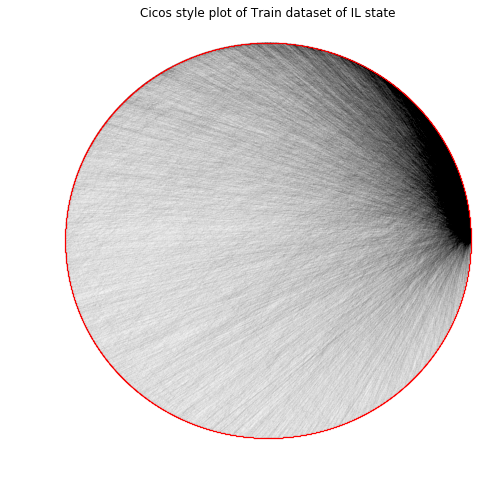

In [227]:
plt.figure(figsize=(8,8))
plt.title("Cicos style plot of Train dataset of IL state")

#Ref: https://stackoverflow.com/questions/21978487/improving-python-networkx-graph-layout
nx.draw_circular(Graph_IL_State_train_friends,node_size=0.004, width=0.004)


In [235]:
from community import community_louvain
parts = community_louvain.best_partition(Graph_IL_State_train_friends)
values = [parts.get(node) for node in Graph_IL_State_train_friends.nodes()]

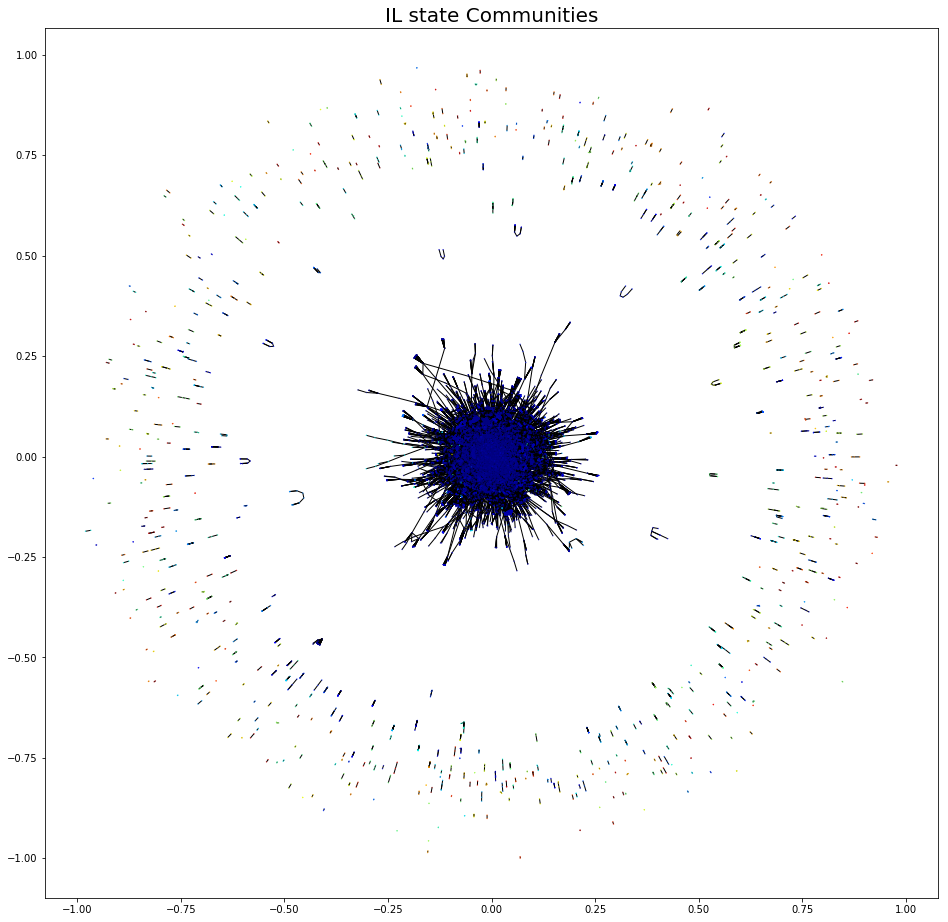

In [238]:
#Ref: https://www.kaggle.com/jagangupta/what-s-in-a-review-yelp-ratings-eda/notebook#community-detection
plt.figure(figsize=(16,16))
plt.axes=False
plt.title("IL state Communities",fontsize=20)
nx.draw_networkx(Graph_IL_State_train_friends, cmap = plt.get_cmap("jet"), node_color = values, node_size = 0.1, with_labels = False,scale=2)

In [39]:
users_train = Graph_IL_State_train_friends.nodes

In [49]:
# Getting the user inforamation who are in the train graph
df_user_IL_state_train = df_user_spark.filter(df_user_spark.id.isin(*users_train))

In [55]:
df_user_IL_state_train_pandas = df_user_IL_state_train.toPandas()

In [50]:
# Getting the food category preferences of the users of train graph
a = df_user_categories_spark.alias('a')
b = df_user_IL_state_train.alias('b')

user_food_preference_df = a.join(b,a.user_id == b.id).select('a.*')

In [51]:
user_food_preference_df_pandas = user_food_preference_df.toPandas()

In [113]:
user_food_preference_df_pandas.head()

,user_id,category,user_category_index
0,11pGk8IZgTgYOWvT8i5ILQ,Bars,263980
1,11pGk8IZgTgYOWvT8i5ILQ,Lounges,263981
2,11pGk8IZgTgYOWvT8i5ILQ,Nightlife,263982
3,37FUZQAVQNT99CjxX3-hYQ,American (New),533035
4,37FUZQAVQNT99CjxX3-hYQ,American (Traditional),533036


In [53]:
#One hot encoding of the food preference of the user
temp_df = pd.get_dummies(user_food_preference_df_pandas, columns=['category'], prefix="cat")
user_food_preference_onehot_pandas = temp_df.groupby('user_id',as_index=False).max()

In [56]:
df_user_IL_state_train_pandas.rename(columns={'id':'user_id'}, inplace=True)

In [204]:
# Merging the users of train graph with their one hot encoded food preference categories
df_user_IL_state_all = pd.merge(df_user_IL_state_train_pandas,user_food_preference_onehot_pandas,how='inner',on=['user_id'])

In [205]:
df_user_IL_state_all.head()

,user_id,name,review_count,yelping_since,useful,funny,cool,fans,average_stars,compliment_hot,...,cat_Venues & Event Spaces,cat_Vietnamese,cat_Waffles,cat_Whiskey Bars,cat_Wigs,cat_Wine & Spirits,cat_Wine Bars,cat_Wineries,cat_Wraps,cat_Yelp Events
0,--2vR0DIsmQ6WfcSzKWigw,Harald,1189,2012-11-27,135752,135251,135723,392,4.38,7695,...,0,0,0,0,0,0,0,0,0,0
1,--A4pFATzQJx9n4l1IAC3A,Sally,186,2015-09-08,49,9,21,3,4.13,0,...,0,0,0,0,0,0,0,0,0,0
2,--neBDssyZlHqAWgrHtUBQ,Soojin,9,2015-08-02,0,0,0,0,4.78,0,...,0,0,0,0,0,0,0,0,0,0
3,--u09WAjW741FdfkJXxNmg,Uyen,164,2009-05-16,63,99,23,18,3.88,7,...,0,0,0,0,0,0,1,0,0,0
4,-0e6xyw_4zyg-2YtqSlS_g,Michaela,52,2012-04-07,31,22,19,5,3.51,2,...,1,0,0,0,0,1,0,0,1,0


In [206]:
# Removing unnecessary columns
df_user_IL_state_similarity_matrix = df_user_IL_state_all.drop(['name','yelping_since','user_index','user_category_index'], axis=1)

In [215]:
df_user_category_only = df_user_IL_state_similarity_matrix.copy()

selectedCols=[]

selectedCols.append('user_id')
for colName in df_user_category_only.columns:
    if colName.startswith('cat_'):
        selectedCols.append(colName)
        
corelation_filtered_df = df_user_category_only[selectedCols]

corelation_filtered_df.set_index(['user_id'], inplace=True)

co_relation = corelation_filtered_df.corr()

In [209]:
#Ref: https://datascience.stackexchange.com/questions/10459/calculation-and-visualization-of-correlation-matrix-with-pandas
cmap = cmap=sns.diverging_palette(5, 250, as_cmap=True)

def magnify():
    return [dict(selector="th",
                 props=[("font-size", "7pt")]),
            dict(selector="td",
                 props=[('padding', "0em 0em")]),
            dict(selector="th:hover",
                 props=[("font-size", "12pt")]),
            dict(selector="tr:hover td:hover",
                 props=[('max-width', '200px'),
                        ('font-size', '12pt')])
]

co_relation.style.background_gradient(cmap, axis=1)\
    .set_properties(**{'max-width': '80px', 'font-size': '10pt'})\
    .set_caption("Hover to magify")\
    .set_precision(2)\
    .set_table_styles(magnify())

In [197]:
# Performing one hot encoding for city and state columns
df_user_IL_state_similarity_matrix = pd.get_dummies(data=df_user_IL_state_similarity_matrix, columns=['city', 'state'])

In [198]:
# As the user_id is in string format, creating a separate dataframe for it
user_id_df = df_user_IL_state_similarity_matrix['user_id'].tolist()

In [199]:
df_user_IL_state_similarity_matrix = df_user_IL_state_similarity_matrix.drop('user_id',axis = 1)

In [200]:
# Calculating cosine similarity between all the users in the train graph
cosine_similarity_matrix = cosine_similarity(df_user_IL_state_similarity_matrix)

In [201]:
predicted_edges = 0

for index, row in test_friend_df.iterrows():
    user_id = row['user_id']
    friend_id = row['friend_id']
    
    try:
        user_id_index = user_id_df.index(user_id)
        friend_id_index = user_id_df.index(friend_id)
    except ValueError:
        continue
    
   
    similarity_value = cosine_similarity_matrix[user_id_index][friend_id_index]
    if similarity_value < 0.5:
        continue
    
    predicted_edges = predicted_edges + 1    

In [202]:
total_edges_test_df = len(test_friend_df)
accracy = predicted_edges / total_edges_test_df

print(accracy) 
print("for similarity threshold value 0.5")

# If we keep similarity threshold value to 0.5, we have predicted 46% of friendship from test_Data_Set

0.46919431279620855
for similarity threshold value 0.5


# Predecting edges between high degree node with Preferential Attachment

In [121]:
# Getting the degree count of the train graph
IL_state_train_graph_degreeView = nx.degree(Graph_IL_State_train_friends)

In [122]:
sorted_by_degree = sorted(IL_state_train_graph_degreeView, key=lambda tup:tup[1], reverse=True)

In [140]:
# Taking users with very high degree > 30 for preferential attachment
users_with_high_degree = []
for user_id, degree in sorted_by_degree:
    if degree < 30:
        break
    users_with_high_degree.append(user_id)

In [142]:
import itertools
possible_friend_combinations = itertools.combinations(users_with_high_degree, 2)    

In [143]:
# Creating possible friends combinations from the list of high degree users
possible_friend_tuple = []
for aCombination in possible_friend_combinations:
    possible_friend_tuple.append(tuple(aCombination))

In [146]:
# Calculating preferential attachment between the possible friends
preferential_preds = nx.preferential_attachment(Graph_IL_State_train_friends, possible_friend_tuple)

In [147]:
cols = ['user_id','friend_id','preferential_score']
preferential_score_df = pd.DataFrame(columns=cols)

ind = 0
for u,v,p in preferential_preds:
    temp_df = pd.DataFrame({'user_id':u,'friend_id':v,'preferential_score':p}, index={ind})
    preferential_score_df = preferential_score_df.append(temp_df)
    ind = ind + 1

In [188]:
# Calculating predectied edge with help of preferential attachment 
# which gives possible conntection between high degree of nodes
predicted_edge = 0

for index, row in test_friend_df.iterrows():
    user_id = row['user_id']
    friend_id = row['friend_id']
    
    score_one = preferential_score_df.loc[(preferential_score_df["friend_id"] == friend_id) & (preferential_score_df["user_id"] == user_id),"preferential_score"]
    score_two = preferential_score_df.loc[(preferential_score_df["friend_id"] == user_id) & (preferential_score_df["user_id"] == friend_id),"preferential_score"]
    
    max_score = 0
    
    if not score_one.empty and not score_two.empty:
        max_score = max(score_one.item(),score_two.item())
    elif not score_one.empty:
        max_score = score_one.item()
    elif not score_two.empty:
        max_score = score_two.item()
    else:
        continue
    
    predicted_edge = predicted_edge + 1 

In [244]:
# Graph on train dataset
Graph_IL_State_test_friends = nx.from_pandas_edgelist(test_friend_df, 'user_id','friend_id')

# Getting the degree count of the test graph
IL_state_test_graph_degreeView = nx.degree(Graph_IL_State_test_friends)

In [248]:
sorted_by_degree = sorted(IL_state_test_graph_degreeView, key=lambda tup:tup[1], reverse=True)

# Counting users with very high degree > 30 in test dataset
test_users_with_high_degree = []

for user_id, degree in sorted_by_degree:
    if degree < 30:
        break
    test_users_with_high_degree.append(user_id)

print("Number of Users in test dataframe having degree>30: ",len(test_users_with_high_degree))

Number of Users in test dataframe having degree>30:  37


In [249]:
# Edges predicted with the preferential attachment
print("Successfully predicted the edges between high degree nodes: ",predicted_edge)

Successfully predicted the edges between high degree nodes:  385


In [190]:
# Ratio of the edges predicted with the preferential attachment to the total edges in test
print(predicted_edge/total_edges_test_df)

0.04561611374407583


# K-means clustering

In [210]:
from sklearn import ensemble
from sklearn import metrics
from sklearn.cluster import KMeans

In [212]:
def createClusters(cluster_size):
    result = pd.DataFrame(corelation_filtered_df.index)
    user_kmeans_model = KMeans(n_clusters=cluster_size).fit(corelation_filtered_df)
    result['label'] = pd.Series(user_kmeans_model.labels_, index= result.index)
    return result

In [216]:
corelation_filtered_df.head()

,cat_Acai Bowls,cat_Afghan,cat_African,cat_American (New),cat_American (Traditional),cat_Arabian,cat_Argentine,cat_Armenian,cat_Asian Fusion,cat_Australian,...,cat_Venues & Event Spaces,cat_Vietnamese,cat_Waffles,cat_Whiskey Bars,cat_Wigs,cat_Wine & Spirits,cat_Wine Bars,cat_Wineries,cat_Wraps,cat_Yelp Events
user_id,,,,,,,,,,,,,,,,,,,,,
--2vR0DIsmQ6WfcSzKWigw,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
--A4pFATzQJx9n4l1IAC3A,0,0,0,1,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
--neBDssyZlHqAWgrHtUBQ,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
--u09WAjW741FdfkJXxNmg,0,0,0,1,1,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
-0e6xyw_4zyg-2YtqSlS_g,0,0,0,1,1,0,0,0,1,0,...,1,0,0,0,0,1,0,0,1,0


In [217]:
labeled_data = createClusters(20)

In [218]:
labeled_data.head()

,user_id,label
0,--2vR0DIsmQ6WfcSzKWigw,7
1,--A4pFATzQJx9n4l1IAC3A,13
2,--neBDssyZlHqAWgrHtUBQ,3
3,--u09WAjW741FdfkJXxNmg,6
4,-0e6xyw_4zyg-2YtqSlS_g,16


In [221]:
predicted_edges = 0

for index, row in test_friend_df.iterrows():
    user_id = row['user_id']
    friend_id = row['friend_id']
    
    user_label = labeled_data.loc[(labeled_data["user_id"] == user_id),"label"]
    friend_label = labeled_data.loc[(labeled_data["user_id"] == friend_id),"label"]
    
    if not user_label.empty and not friend_label.empty:
        if user_label.item() == friend_label.item():
            predicted_edges = predicted_edges + 1

In [223]:
print(predicted_edges/total_edges_test_df)

0.052843601895734595
